In [164]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from sklearn.metrics import mean_squared_error
color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')

In [165]:
priceData = pd.read_csv("./data/processed/pricesList.csv")
rainfallData = pd.read_csv("./data/processed/rainfallData.csv")

In [166]:
# extract only one vegetable for the prediction
priceData = priceData[priceData["Name"] == "Carrot_UPCVEG_1kg"]

In [167]:
def featureEngineering(data):
    data2 = data.copy()
    # iterate through the rainfallData and add the rainfall to the priceData
    # for index, row in rainfallData.iterrows():
    #     # match the year and month from the rainfall data to the pricedata
    #     year = row['year']
    #     month = row['month']
    #     data2.loc[(data2['Year'] == year) & (data2['Month'] == month), 'anuradhapura'] = row['anuradhapura']
    #     data2.loc[(data2['Year'] == year) & (data2['Month'] == month), 'jaffna'] = row['jaffna']
    #     data2.loc[(data2['Year'] == year) & (data2['Month'] == month), 'nuwaraeliya'] = row['nuwaraeliya']

    return data2
    

In [168]:
def extractDate(data):
    data2 = data.copy()
    data2["Datetime"] = pd.to_datetime(data2[['Year', 'Month']].assign(day=(data2["Week"]-1)*7 +1))
    data2 = data2.set_index('Datetime')
    return data2

In [170]:
def preprocessData(data):
    data2 = data.copy()
    data2 = data2.dropna()
    return data2

In [171]:
# Removing outliers
from scipy.stats import gaussian_kde
def remove_outliers_kde(df, column_name, threshold=0.05):
    # Extract the values of the column
    column_values = df[column_name].values
    
    # Fit the kernel density estimation
    kde = gaussian_kde(column_values)
    
    # Evaluate the KDE for each data point
    density = kde.evaluate(column_values)
    
    # Sort the data points by their density values
    sorted_indices = np.argsort(density)
    
    # Calculate the threshold index based on the given threshold
    threshold_index = int(len(sorted_indices) * threshold)
    
    # Get the indices of non-outliers
    non_outlier_indices = sorted_indices[threshold_index:]
    
    # Filter out the non-outliers
    df_cleaned = df.iloc[non_outlier_indices]
    df_cleaned = df_cleaned.reset_index(drop=True)
    return df_cleaned

In [172]:
df = featureEngineering(priceData);
df = preprocessData(df);
# df = remove_outliers_kde(df, 'Price')
df = extractDate(df)

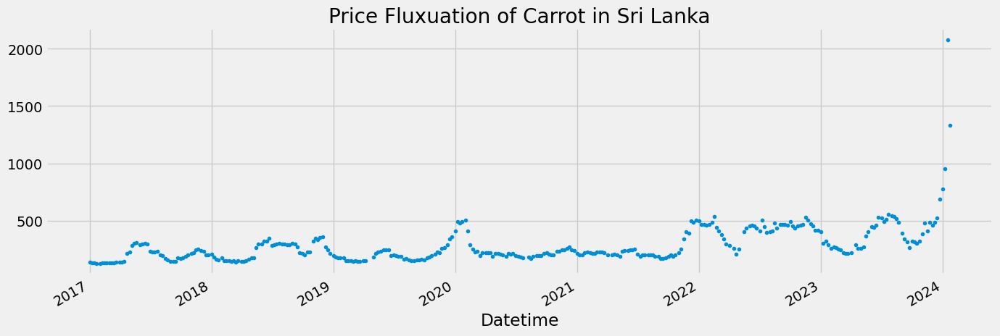

In [173]:
df["Price"].plot(style='.',figsize=(15, 5), title="Price Fluxuation of Carrot in Sri Lanka")
plt.show()

In [174]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 333 entries, 2017-01-01 to 2024-01-22
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    333 non-null    object 
 1   Price   333 non-null    float64
 2   Week    333 non-null    int64  
 3   Month   333 non-null    int64  
 4   Year    333 non-null    int64  
 5   Season  333 non-null    object 
dtypes: float64(1), int64(3), object(2)
memory usage: 18.2+ KB


In [175]:
split_date = "2022-08-01"
train = df.loc[df.index < split_date]
test = df.loc[df.index >= split_date]

/tmp/ipykernel_28250/3626683806.py:5: UserWarning: Legend does not support handles for str instances.
A proxy artist may be used instead.
See: https://matplotlib.org/stable/users/explain/axes/legend_guide.html#controlling-the-legend-entries
  ax.legend("Training set", "Test Set")


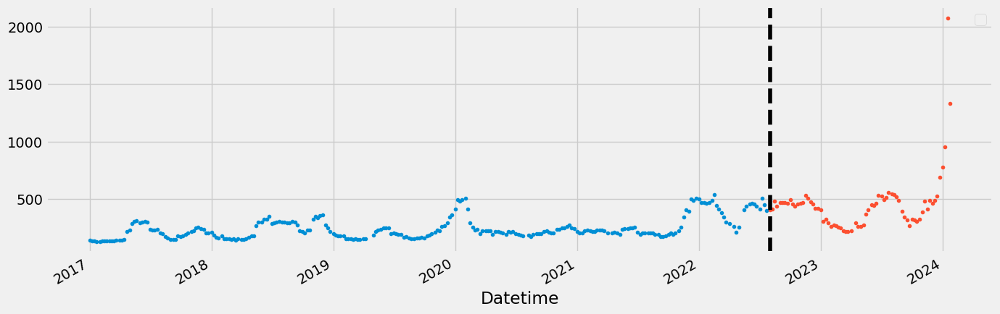

In [176]:
fix, ax = plt.subplots(1, 1, figsize=(15, 5))
train['Price'].plot(ax=ax, label="Train Set", style=".")
test['Price'].plot(ax=ax, label="Test Set", style=".")
ax.axvline(split_date, color="black", ls="--")
ax.legend("Training set", "Test Set")
plt.show()

<Axes: title={'center': 'Price Fluxuation of Carrot in Sri Lanka'}, xlabel='Datetime'>

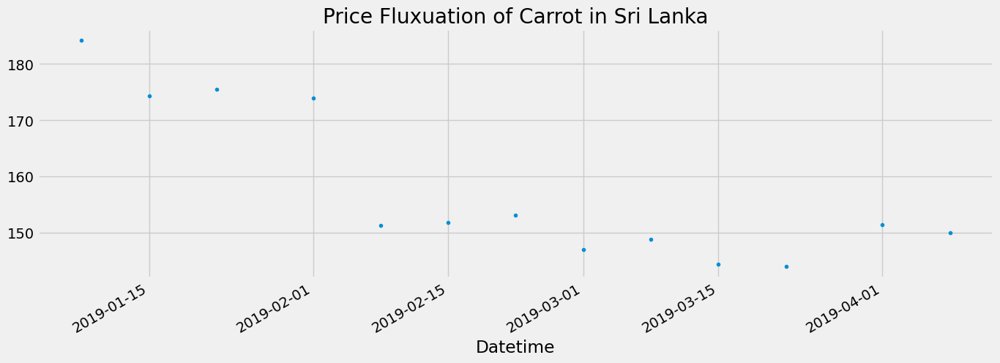

In [177]:
# plot week of data
df["Price"].loc[(df.index > "2019-01-01") & (df.index < "2019-05-01")].plot(style=".", figsize=(15, 5), title="Price Fluxuation of Carrot in Sri Lanka")

In [178]:
df.columns

Index(['Name', 'Price', 'Week', 'Month', 'Year', 'Season'], dtype='object')

In [180]:
FEATURES = ["Week", "Month", "Year", 
            # "anuradhapura", 
            # "jaffna", 
            # "nuwaraeliya"
            ]
TARGET = "Price"

X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]


In [206]:
# Model Creation
reg = xgb.XGBRegressor(n_estimators=1741, learning_rate=0.01)
reg.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=1741,verbose=50)
# reg.fit(X_test, y_test)

[0]	validation_0-rmse:93.23940	validation_1-rmse:331.42796
[50]	validation_0-rmse:64.89804	validation_1-rmse:288.37154
[100]	validation_0-rmse:47.66167	validation_1-rmse:266.83237
[150]	validation_0-rmse:37.04860	validation_1-rmse:256.95027


/home/iddhi/.local/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[200]	validation_0-rmse:30.56114	validation_1-rmse:252.07450
[250]	validation_0-rmse:26.45949	validation_1-rmse:249.56390
[300]	validation_0-rmse:23.56454	validation_1-rmse:248.45404
[350]	validation_0-rmse:21.56255	validation_1-rmse:248.23076
[400]	validation_0-rmse:20.07534	validation_1-rmse:248.26034
[450]	validation_0-rmse:18.41508	validation_1-rmse:248.44900
[500]	validation_0-rmse:16.78685	validation_1-rmse:248.64688
[550]	validation_0-rmse:15.35104	validation_1-rmse:248.82239
[600]	validation_0-rmse:14.03285	validation_1-rmse:248.97376
[650]	validation_0-rmse:13.11795	validation_1-rmse:249.10185
[700]	validation_0-rmse:12.33157	validation_1-rmse:249.20785
[750]	validation_0-rmse:11.70808	validation_1-rmse:249.29457
[800]	validation_0-rmse:11.17260	validation_1-rmse:249.36444
[850]	validation_0-rmse:10.65207	validation_1-rmse:249.42096
[900]	validation_0-rmse:10.14034	validation_1-rmse:249.46291
[950]	validation_0-rmse:9.73062	validation_1-rmse:249.49622
[1000]	validation_0-rmse:

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1741, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [213]:
from sklearn.ensemble import RandomForestRegressor
reg = RandomForestRegressor(bootstrap=True, criterion='absolute_error',max_depth=None, max_leaf_nodes=None,n_estimators=10000, random_state=None, n_jobs=1, verbose=0)
reg.fit(X_train, y_train)
# reg.fit(X_test, y_test)

RandomForestRegressor(criterion='absolute_error', n_estimators=10000, n_jobs=1)

In [220]:
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
# Define the parameter grid
param_grid = {
    'iterations': [1000, 5000, 10000, 20000],
    'depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1],
    'loss_function': ['RMSE']
}
reg = CatBoostRegressor()
grid_search = GridSearchCV(estimator=reg, param_grid=param_grid, cv=5, scoring='neg_root_mean_squared_error', verbose=2)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model
best_model = grid_search.best_estimator_

# Evaluate the best model
train_score = best_model.score(X_train, y_train)
test_score = best_model.score(X_test, y_test)
print("Train Score:", train_score)
print("Test Score:", test_score)

# reg = CatBoostRegressor(iterations=30000, depth=5, learning_rate=0.001, loss_function='RMSE')
# reg.fit(X_train, y_train, eval_set=(X_test, y_test), verbose=100)
# reg.fit(X_test, y_test)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
0:	learn: 97.6472882	total: 282us	remaining: 8.48s
1:	learn: 97.6149701	total: 421us	remaining: 6.32s
2:	learn: 97.5764135	total: 497us	remaining: 4.98s
3:	learn: 97.5484625	total: 566us	remaining: 4.25s
4:	learn: 97.5210399	total: 631us	remaining: 3.79s
5:	learn: 97.4873189	total: 689us	remaining: 3.45s
6:	learn: 97.4507938	total: 750us	remaining: 3.21s
7:	learn: 97.4243414	total: 809us	remaining: 3.03s
8:	learn: 97.3812723	total: 870us	remaining: 2.9s
9:	learn: 97.3474479	total: 927us	remaining: 2.78s
10:	learn: 97.3086731	total: 987us	remaining: 2.69s
11:	learn: 97.2670509	total: 1.05ms	remaining: 2.62s
12:	learn: 97.2289235	total: 1.11ms	remaining: 2.57s
13:	learn: 97.1993957	total: 1.17ms	remaining: 2.52s
14:	learn: 97.1733816	total: 1.25ms	remaining: 2.49s
15:	learn: 97.1424166	total: 1.32ms	remaining: 2.47s
16:	learn: 97.1037331	total: 1.39ms	remaining: 2.45s
17:	learn: 97.0646772	total: 1.45ms	remaining: 2.42s
18:	lear

KeyboardInterrupt: 

In [83]:
from prophet import Prophet
model = Prophet()
model.fit(train.reset_index().rename(columns={"Datetime": "ds", "Price": "y"}))
forecast = model.predict(test.reset_index().rename(columns={"Datetime": "ds", "Price": "y"}))

/home/iddhi/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
13:06:15 - cmdstanpy - INFO - Chain [1] start processing
13:06:15 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
fix, ax = plt.subplots(figsize=(10, 5))
fig = model.plot(forecast, ax=ax)
plt.show()

In [ ]:
f, ax = plt.subplots(1, 1, figsize=(15, 5))
ax.scatter(test.index, test["Price"], color="r", label="True Price")
fig = model.plot(forecast, ax=ax)
plt.show()


<Axes: xlabel='Datetime'>

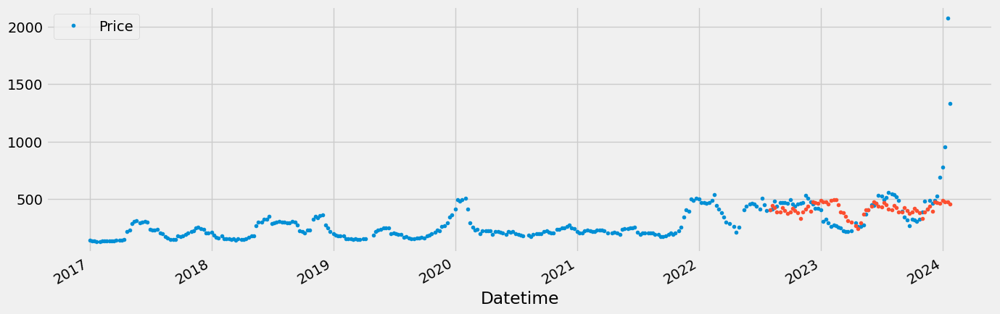

In [218]:
# forecast on test
style = "."
test2 = test.copy()
test2["prediction"] = reg.predict(X_test)
df2 = df.merge(test2[["prediction"]], how="left", left_index=True, right_index=True)
ax = df2[["Price"]].plot(style=style, figsize=(15,5))
df2["prediction"].plot(style=style, ax=ax)

<Axes: xlabel='Datetime'>

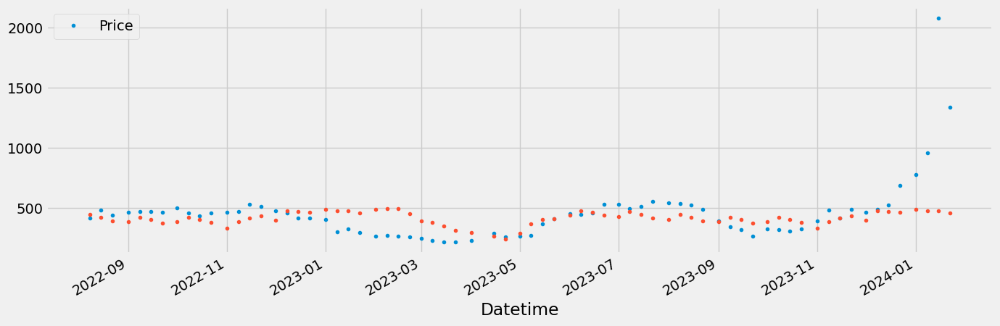

In [219]:
ax = df2.loc[(df2.index > "2022-08-01") & (df2.index < "2025-01-01")][["Price"]].plot(figsize=(15,5), style=style)
df2.loc[(df2.index > "2022-08-01") & (df2.index < "2025-01-01")]["prediction"].plot(ax=ax, style=style)

# Arima

In [ ]:
from pmdarima import auto_arima

In [ ]:
df2 = df.copy()
stepwise_fit = auto_arima(df2["Price"], trace=True, suppress_warnings=True)
stepwise_fit.summary()

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

In [ ]:
model = ARIMA(train["Price"], order=(2,1,2))
model = model.fit()
model.summary()

In [ ]:
start = len(train)
end = len(train) + len(test) - 1
predictions = model.predict(start=start, end=end, typ="levels").rename("ARIMA Predictions")
predictions.index = test.index
print(predictions)

In [ ]:
predictions.plot(legend=True)
# test["Price"].plot(legend=True)